<a href="https://colab.research.google.com/github/JahnaviKashyap19/Waste-Material-Detection/blob/main/yolov8_object_detection_on_custom_data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!nvidia-smi

Thu Aug 10 10:26:58 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   70C    P8    12W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
import os
HOME = os.getcwd()
print (HOME)


/content


In [3]:
!pip install ultralytics

from IPython import display
display.clear_output
!yolo mode=checks


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 616.7/616.7 kB 7.5 MB/s eta 0:00:00
WARNING ⚠️ 'yolo mode=checks' is deprecated. Use 'yolo checks' instead.
Ultralytics YOLOv8.0.151 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 24.4/78.2 GB disk)


In [4]:
from ultralytics import YOLO
from IPython.display import display,Image

In [5]:
%cd {HOME}
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="CvFV8cDOTEuukKgg8yfh")
project = rf.workspace("btp-dataset").project("waste-material-detection")
dataset = project.version(8).download("yolov8")



/content
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.4/57.4 kB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.3/155.3 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.3/59.3 kB 8.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.5 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9656 sha256=13405b8ad74bd1eab06505b560eb09d1a60aaddeae0cb95423945cf57d524cd7
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.1.1
    Uninstalling pyparsing-3.1.1:
      Successfully uninstalled pyparsing-3.1.1
  Attempting uninstall: idna
  

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.134 is required but found version=8.0.151, to fix: `pip install ultralytics==8.0.134`


Extracting Dataset Version Zip to waste-material-detection-8 in yolov8:: 100%|██████████| 438/438 [00:00<00:00, 1491.97it/s]


In [6]:
%cd {HOME}
!yolo task=detect mode=train model=yolov8s.pt data={dataset.location}/data.yaml epochs=300 imgsz=800

/content
100% 21.5M/21.5M [00:00<00:00, 214MB/s]
Ultralytics YOLOv8.0.151 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/waste-material-detection-8/data.yaml, epochs=300, patience=50, batch=16, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, for

In [8]:
!ls {HOME}/runs/detect/train/

args.yaml					    results.png
confusion_matrix_normalized.png			    train_batch0.jpg
confusion_matrix.png				    train_batch1.jpg
events.out.tfevents.1691663418.9c4423e9b328.1175.0  train_batch2.jpg
F1_curve.png					    train_batch3770.jpg
labels_correlogram.jpg				    train_batch3771.jpg
labels.jpg					    train_batch3772.jpg
P_curve.png					    val_batch0_labels.jpg
PR_curve.png					    val_batch0_pred.jpg
R_curve.png					    weights
results.csv


/content


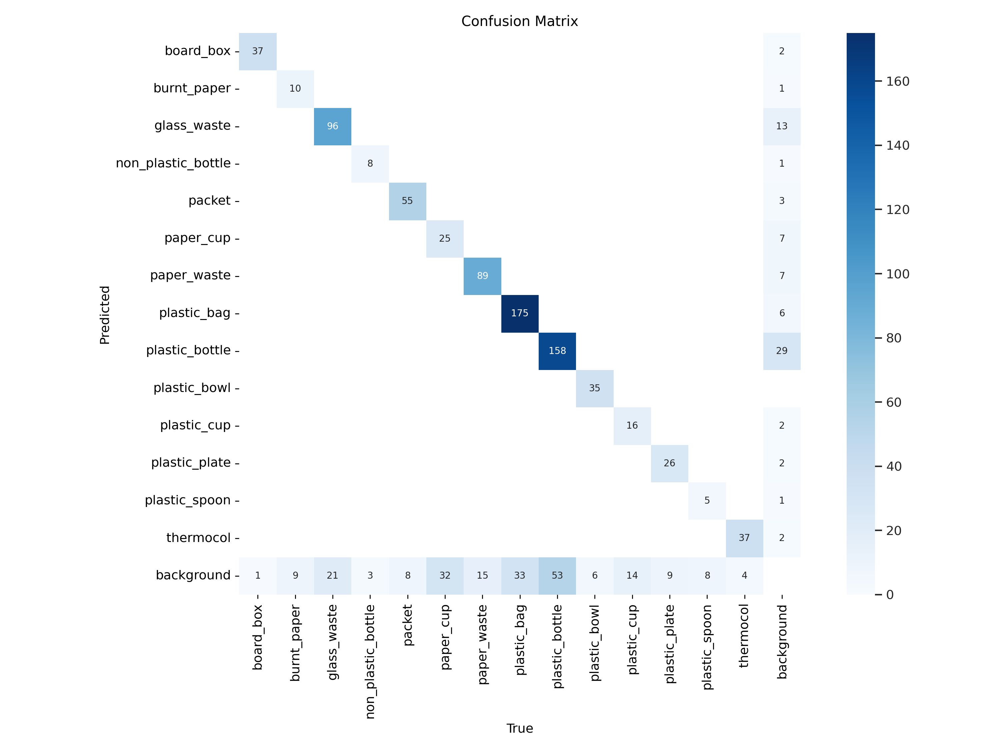

In [10]:
%cd  {HOME}
Image(filename=f'{HOME}/runs/detect/train/confusion_matrix.png'
, width=900)

In [11]:
import pandas as pd

# Set the path to the CSV file
csv_path = f"{HOME}/runs/detect/train/results.csv"

# Load the CSV file into a pandas DataFrame
df = pd.read_csv(csv_path)

# Display the DataFrame in the notebook
df

,epoch,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,0,2.46540,5.02980,1.66540,0.02904,0.03885,0.02587,0.01511,2.05820,4.27060,1.38500,0.000067,0.000067,0.000067
1,1,2.25340,3.37260,1.39910,0.11217,0.04864,0.06280,0.03647,2.03470,4.49650,1.40020,0.000139,0.000139,0.000139
2,2,2.11510,2.63600,1.32100,0.16770,0.04197,0.08768,0.06748,1.90200,3.92530,1.34260,0.000210,0.000210,0.000210
3,3,2.01120,2.33530,1.28410,0.13477,0.10625,0.10540,0.06497,1.82040,5.56070,1.29530,0.000281,0.000281,0.000281
4,4,1.95980,2.23180,1.24560,0.12182,0.09236,0.08720,0.05442,1.82880,3.61760,1.31600,0.000351,0.000351,0.000351
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,295,0.94662,0.52613,0.88408,0.93413,0.70197,0.77612,0.58572,0.86291,0.53772,0.87693,0.000017,0.000017,0.000017
296,296,0.91883,0.50966,0.88312,0.91733,0.70763,0.77686,0.58757,0.86393,0.53791,0.87731,0.000015,0.000015,0.000015
297,297,0.91416,0.50307,0.87566,0.92114,0.70372,0.77714,0.58768,0.86472,0.53792,0.87710,0.000013,0.000013,0.000013
298,298,0.93285,0.51235,0.88330,0.91301,0.70382,0.77617,0.58732,0.86256,0.53765,0.87661,0.000011,0.000011,0.000011


/content


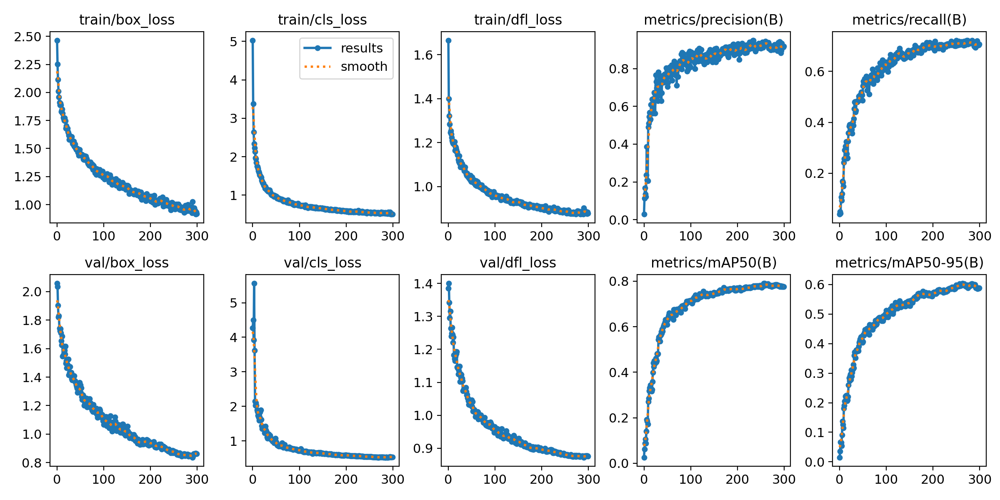

In [12]:
%cd  {HOME}
Image(filename=f'{HOME}/runs/detect/train/results.png'
, width=900)

/content


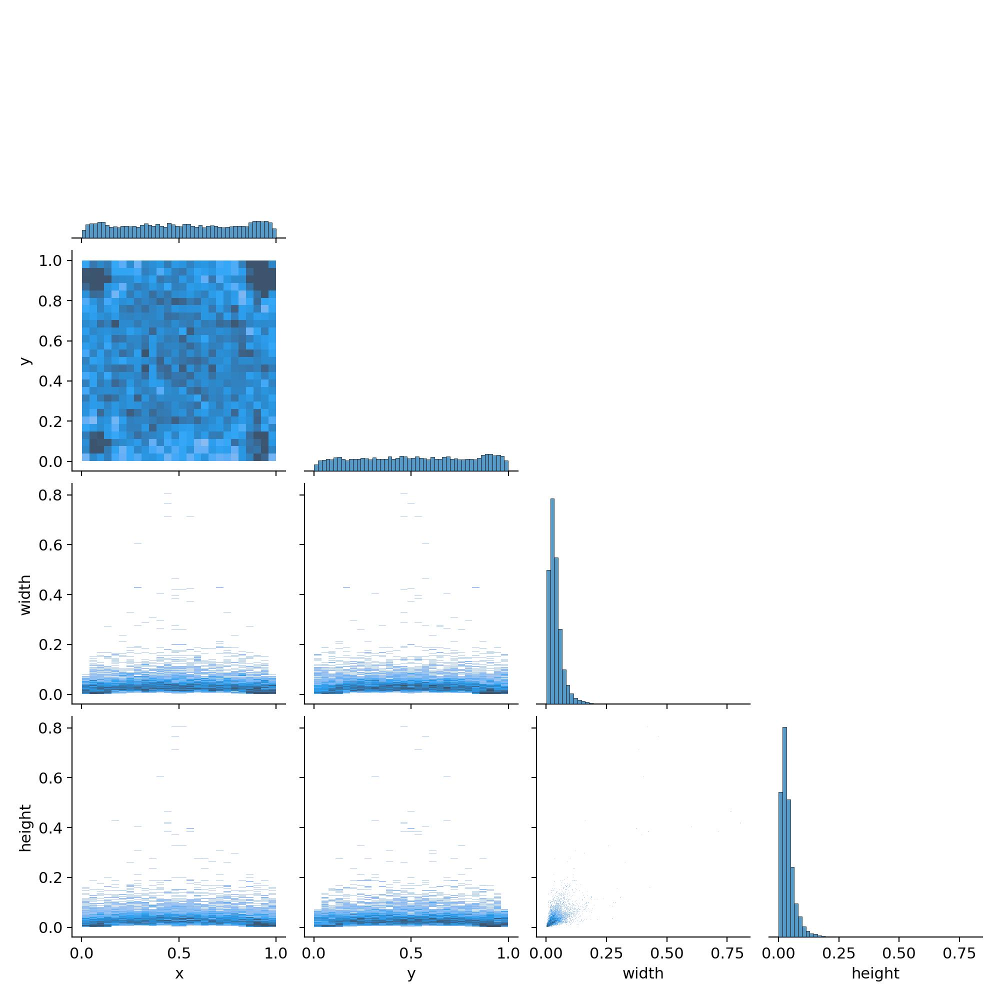

In [13]:
%cd  {HOME}
Image(filename=f'{HOME}/runs/detect/train/labels_correlogram.jpg'
, width=600)

/content


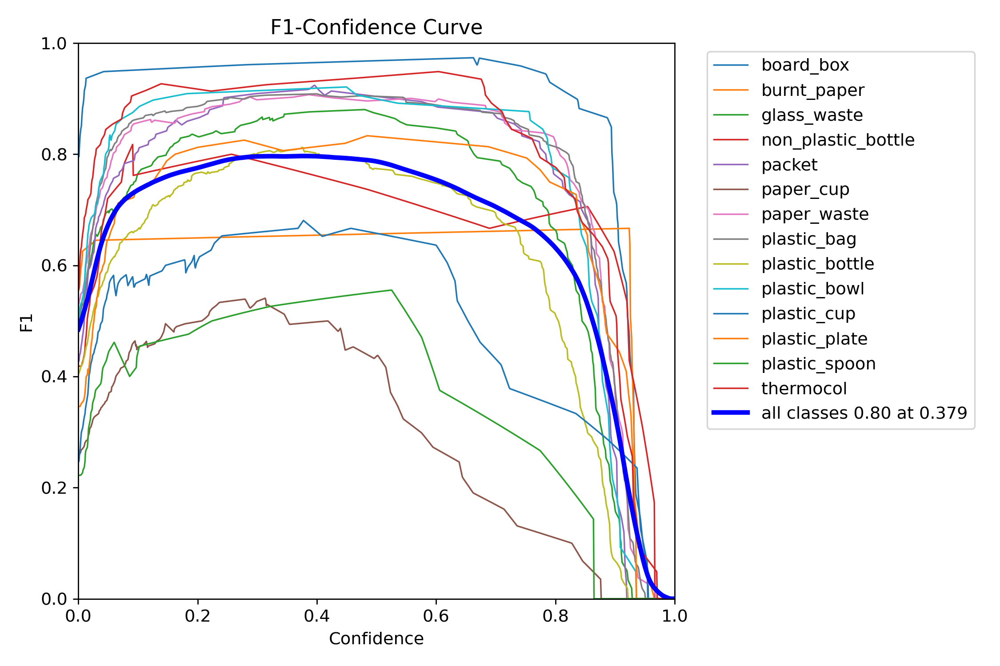

In [14]:
%cd  {HOME}
Image(filename=f'{HOME}/runs/detect/train/F1_curve.png'
, width=600)

/content


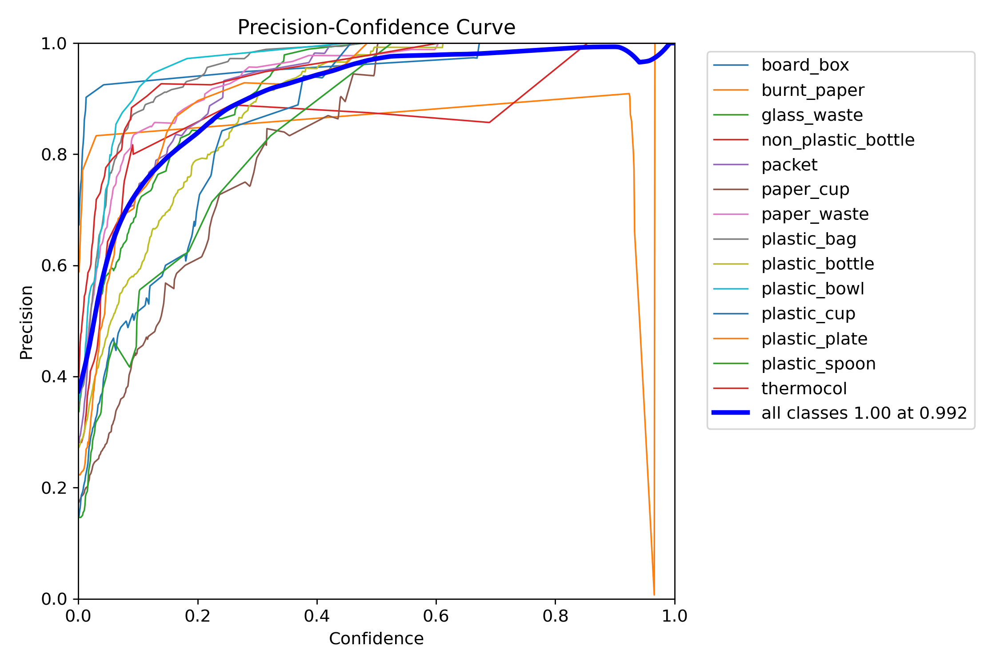

In [15]:
%cd  {HOME}
Image(filename=f'{HOME}/runs/detect/train/P_curve.png'
, width=600)

/content


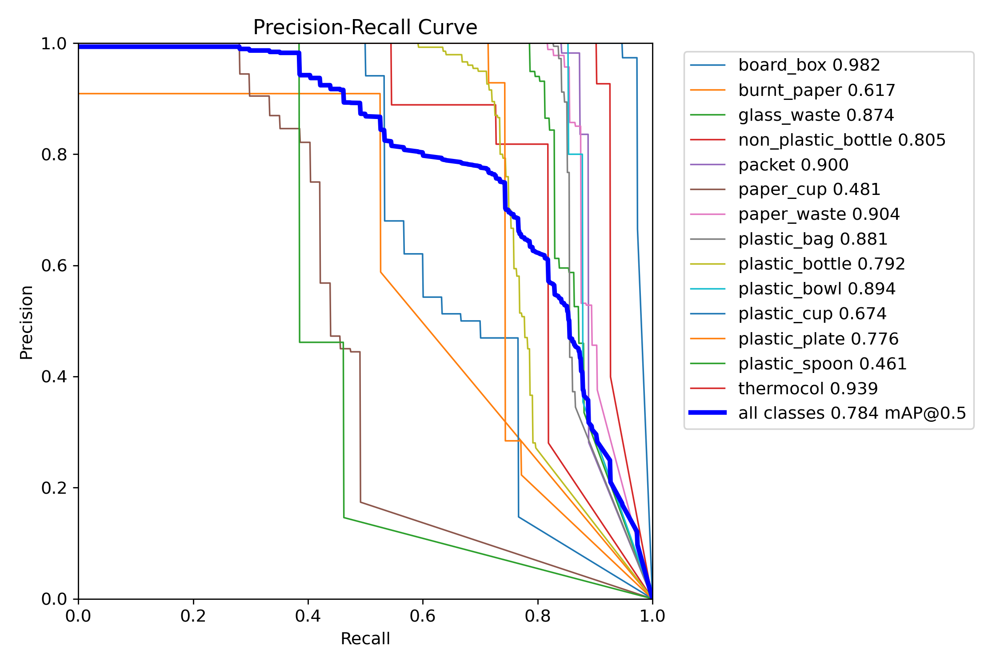

In [16]:
%cd  {HOME}
Image(filename=f'{HOME}/runs/detect/train/PR_curve.png'
, width=600)

%cd  {HOME}
Image(filename=f'{HOME}/runs/detect/train/R_curve.png	'
, width=2000)

/content


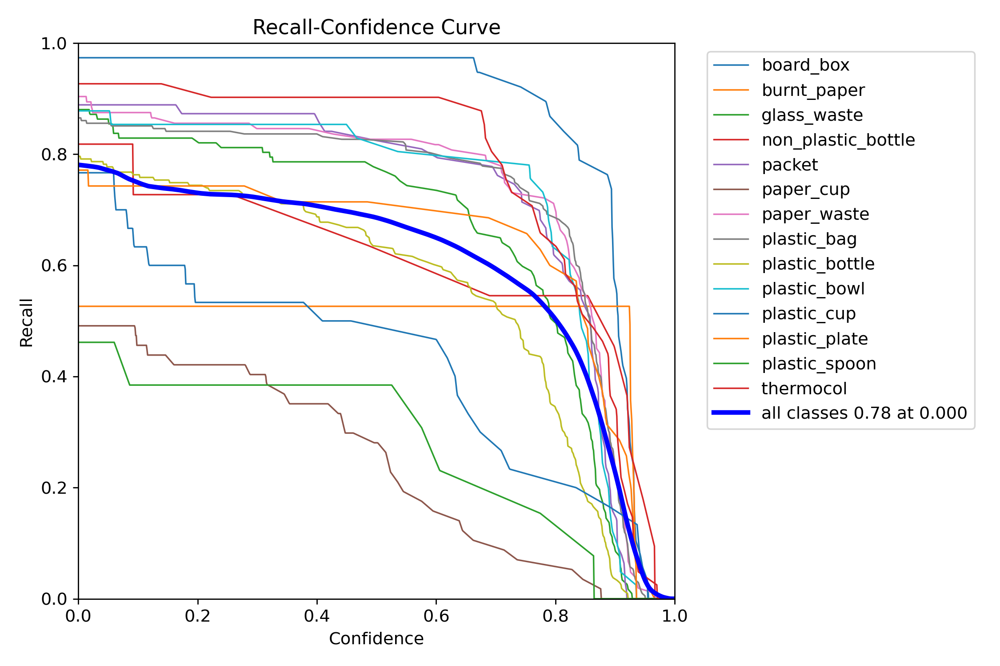

In [17]:
%cd  {HOME}
Image(filename=f'{HOME}/runs/detect/train/R_curve.png'
, width=600)

/content


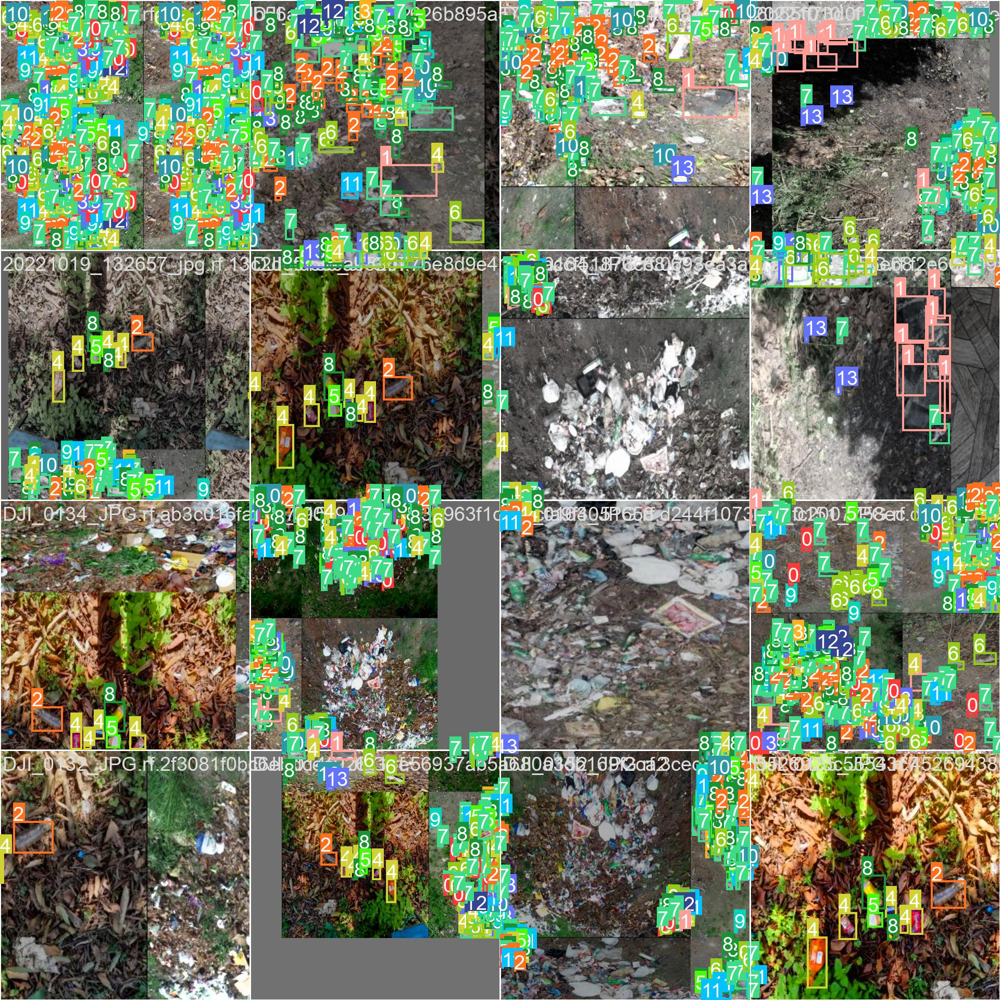

In [18]:
%cd  {HOME}
Image(filename=f'{HOME}/runs/detect/train/train_batch0.jpg'
, width=1000)

In [19]:
%cd {HOME}
!yolo task=detect mode=val model={HOME}/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

/content
Ultralytics YOLOv8.0.151 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11131002 parameters, 0 gradients
val: Scanning /content/waste-material-detection-8/valid/labels.cache... 10 images, 0 backgrounds, 0 corrupt: 100% 10/10 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 1/1 [00:00<00:00,  2.20it/s]
                   all         10        988      0.939      0.708      0.788      0.607
             board_box         10         38      0.956      0.974      0.982      0.898
           burnt_paper         10         19      0.864      0.526      0.617      0.581
           glass_waste         10        117      0.969      0.778      0.865      0.636
    non_plastic_bottle         10         11      0.881      0.674      0.815      0.637
                packet         10         63       0.97      0.873      0.899      0.696
             paper_cup         10       

In [20]:
!ls {HOME}/runs/detect/val/

confusion_matrix_normalized.png  P_curve.png   val_batch0_labels.jpg
confusion_matrix.png		 PR_curve.png  val_batch0_pred.jpg
F1_curve.png			 R_curve.png


/content


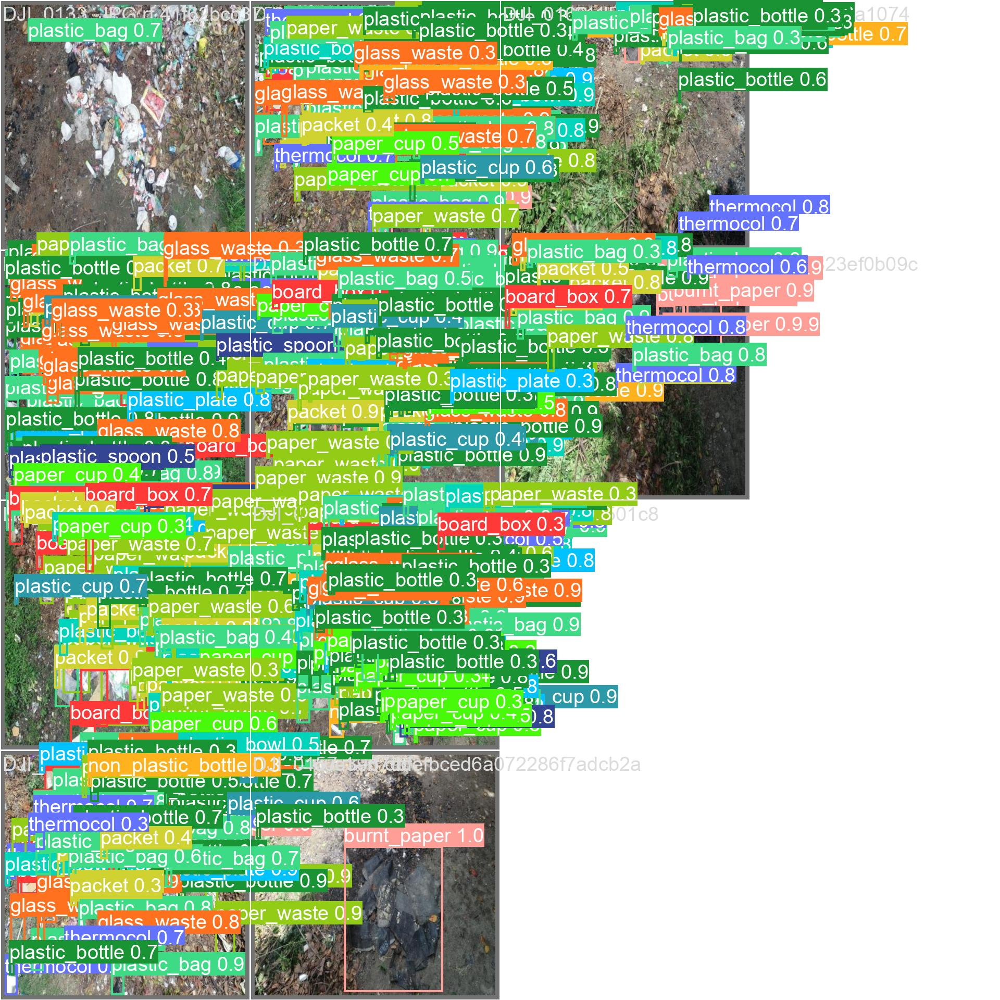

In [21]:
%cd  {HOME}
Image(filename=f'{HOME}/runs/detect/val/val_batch0_pred.jpg'
,width=600)

In [22]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.25 source={dataset.location}/test/images save=True

/content
Ultralytics YOLOv8.0.151 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11131002 parameters, 0 gradients

image 1/5 /content/waste-material-detection-8/test/images/DJI_0134_JPG.rf.33f201367ee3d88494f90c70cf034afe.jpg: 800x800 5 board_boxs, 21 glass_wastes, 2 non_plastic_bottles, 12 packets, 4 paper_cups, 13 paper_wastes, 28 plastic_bags, 31 plastic_bottles, 3 plastic_bowls, 3 plastic_cups, 7 plastic_plates, 2 plastic_spoons, 2 thermocols, 24.7ms
image 2/5 /content/waste-material-detection-8/test/images/DJI_0144_JPG.rf.720415b0eb8c2a25c82e9e8076815772.jpg: 800x800 7 board_boxs, 22 glass_wastes, 1 non_plastic_bottle, 2 packets, 29 paper_cups, 9 paper_wastes, 23 plastic_bags, 40 plastic_bottles, 7 plastic_bowls, 3 plastic_cups, 10 plastic_plates, 1 plastic_spoon, 5 thermocols, 24.7ms
image 3/5 /content/waste-material-detection-8/test/images/DJI_0145_JPG.rf.bb358448bfc3ad6d67f5c744404501c3.jpg: 800x800 1 burnt_paper, 1 glass_waste

In [23]:
!ls {HOME}/runs/detect/predict/

DJI_0134_JPG.rf.33f201367ee3d88494f90c70cf034afe.jpg
DJI_0144_JPG.rf.720415b0eb8c2a25c82e9e8076815772.jpg
DJI_0145_JPG.rf.bb358448bfc3ad6d67f5c744404501c3.jpg
DJI_0150-1-.rf.b2449bca1e1fce40619621cf03a7949c.jpg
DJI_0158_JPG.rf.b8d2e56dad6de163d848665d3753be0e.jpg


/content


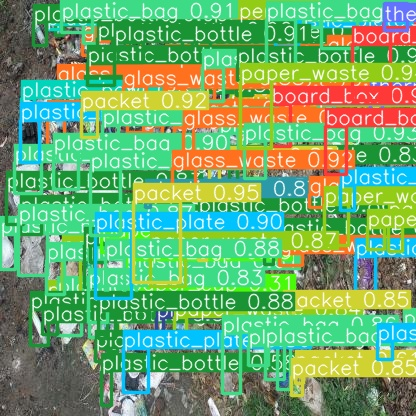

In [24]:
%cd  {HOME}
Image(filename=f'{HOME}/runs/detect/predict/DJI_0134_JPG.rf.33f201367ee3d88494f90c70cf034afe.jpg'
,width=600)

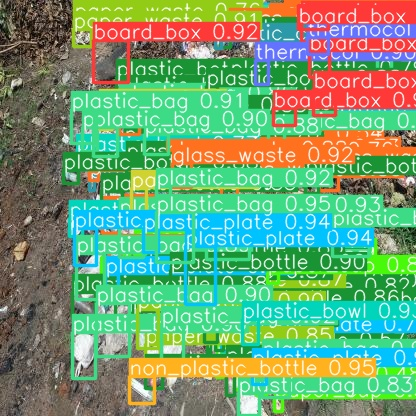

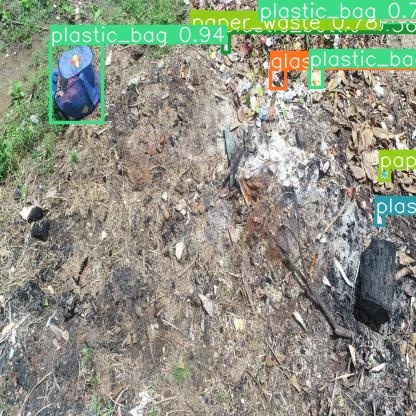

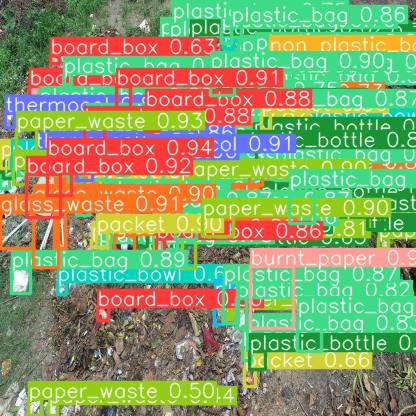

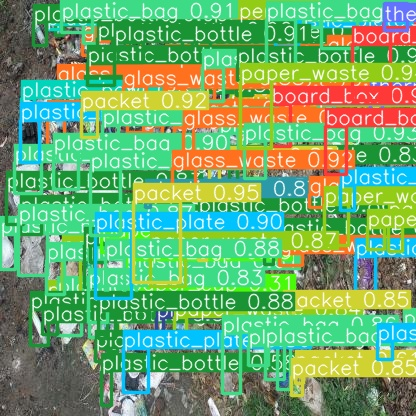

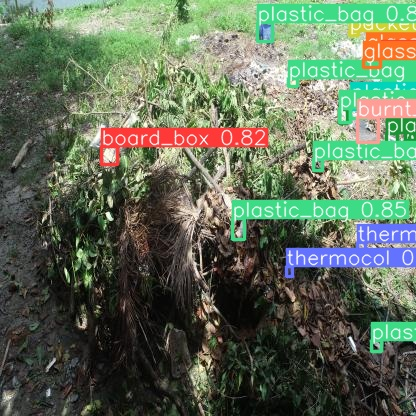

In [26]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/predict/*.jpg')[:5]:
      display(Image(filename=image_path, width=600))
      print("\n")

In [34]:
!pip install tensorflow
import tensorflow as tf



In [35]:
%load_ext tensorboard


In [36]:
%tensorboard --logdir runs/detect/train


<IPython.core.display.Javascript object>

In [39]:
!zip -r folder_name.zip /content/runs


  adding: content/runs/ (stored 0%)
  adding: content/runs/detect/ (stored 0%)
  adding: content/runs/detect/train/ (stored 0%)
  adding: content/runs/detect/train/confusion_matrix_normalized.png (deflated 17%)
  adding: content/runs/detect/train/train_batch3770.jpg (deflated 2%)
  adding: content/runs/detect/train/train_batch1.jpg (deflated 1%)
  adding: content/runs/detect/train/results.png (deflated 8%)
  adding: content/runs/detect/train/confusion_matrix.png (deflated 19%)
  adding: content/runs/detect/train/args.yaml (deflated 51%)
  adding: content/runs/detect/train/train_batch3772.jpg (deflated 3%)
  adding: content/runs/detect/train/R_curve.png (deflated 5%)
  adding: content/runs/detect/train/labels.jpg (deflated 23%)
  adding: content/runs/detect/train/train_batch0.jpg (deflated 0%)
  adding: content/runs/detect/train/weights/ (stored 0%)
  adding: content/runs/detect/train/weights/last.pt (deflated 8%)
  adding: content/runs/detect/train/weights/best.pt (deflated 8%)
  addin

In [40]:
from google.colab import files

files.download('folder_name.zip')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>